### Linear Models
- Ridge Regression
- Lasso Regression
- Elastic Net
- Polynomial Regression

Reference: http://scikit-learn.org/stable/modules/linear_model.html

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import minmax_scale, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression

### DATA PREPARATION & PREPROCESSING PIPELINE

In [2]:
def load_data():
    df = pd.read_csv("../data/autos_removed_target_mv.csv")
    return df

# drop all missing vals
def handling_mv(df):
    df = df.replace("?", np.nan)
    df = df.dropna()
    return df

# preprocessing
def preprocessing(df):
    y = df['normalized-losses']
    X = df.ix[:, 1:]
    
    # divide real and cat vals
    cols_real = list(X.describe().columns)
    cols_cat = [col for col in X.columns if col not in cols_real]
    X_real = X[cols_real]
    X_cat = X[cols_cat]
    
    # scaling real vlas (minmax scale; 0~1)
    X_scaled = minmax_scale(X_real)
    dfX_scale = pd.DataFrame(X_scaled, columns=cols_real)

    # dummies cat vals
    X_dummies = pd.get_dummies(X_cat)
    
    # reindex & merge real and cat DF
    dfX_scale.reset_index(drop=True, inplace=True)
    X_dummies.reset_index(drop=True, inplace=True)
    X_pre = pd.concat([dfX_scale, X_dummies], axis=1)
    
    return X_pre, y

df = load_data()
df = handling_mv(df)
X_pre, y = preprocessing(df)

In [4]:
# grid search cv
def modeling(algo, param_grid, cv=None, scoring="neg_mean_squared_error"):    
    model = GridSearchCV(algo,
                        param_grid,
                        cv=cv,
                        scoring=scoring)
    return model.fit(X_pre, y)

# parameter search graph 2D, 3D
def param_graph(model, param_names):
    rmse = (-model.cv_results_['mean_test_score'])**(1/2)

    if len(param_names) == 1:
        x = model.param_grid[param_names[0]]
        y = rmse

        plt.style.use("seaborn-white")
        plt.scatter(x=x, y=y)
        print("best param: ", model.best_params_, "\nmin rmse: ", np.min(rmse))
        
    elif len(param_names) == 2:
        x = [x[param_names[0]] for x in model.cv_results_['params']]
        y = [x[param_names[1]] for x in model.cv_results_['params']]
        z = rmse
        xx, yy = np.meshgrid(x, y)

        fig = plt.figure()
        ax = Axes3D(fig)
        ax.plot_surface(xx, yy, z, cmap='rainbow')
        plt.show()
        print("best param: ", model.best_params_, "\nmin rmse: ", np.min(rmse))
        
    else:
        print("lenth of param_names list must be 1 or 2")

### RIDGE

In [5]:
param_grid = {
    "alpha": np.logspace(-2, 1, 50)
}

ridge_model = modeling(Ridge(), param_grid, cv=10)

best param:  {'alpha': 0.44984326689694465} 
min rmse:  30.76936711057728


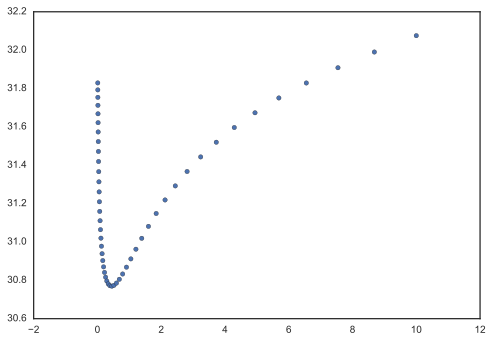

In [6]:
param_graph(ridge_model, ['alpha'])

### LASSO

In [7]:
param_grid = {
    "alpha": np.logspace(-2, 0.3, 50)
}
lasso_model = modeling(Lasso(normalize=True), param_grid, cv=5)

best param:  {'alpha': 0.012413022740718939} 
min rmse:  32.20985905407701


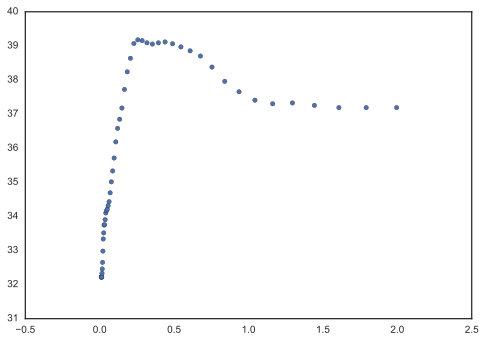

In [8]:
param_graph(lasso_model, ['alpha'])

### ELASTIC NET

In [9]:
param_grid = {
    'alpha': np.logspace(-2, 0.2, 50),
    'l1_ratio': np.linspace(0.01, 0.99, 20)
}
elastic_model = modeling(ElasticNet(normalize=True), param_grid, cv=5)

In [10]:
param_graph(elastic_model, ['alpha', 'l1_ratio'])

best param:  {'alpha': 0.01, 'l1_ratio': 0.9384210526315789} 
min rmse:  30.97686045964457


### POLYNOMIAL REGRESSION

In [11]:
poly_pipe = Pipeline([
    ('poly', PolynomialFeatures(interaction_only=True)),
    ('linear', LinearRegression())
])

In [14]:
param_grid = {
    'poly__degree': [1, 2, 3, 4, 5]
}

In [12]:
poly_model = modeling(poly_pipe, param_grid, cv=2)

/Users/jkpark/.pyenv/versions/3.5.1/envs/dss/lib/python3.5/site-packages/scipy/linalg/basic.py:1226: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  warnings.warn(mesg, RuntimeWarning)


best param:  {'poly__degree': 3} 
min rmse:  32.13111377166122


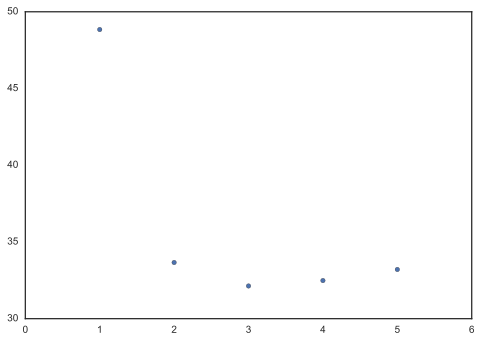

In [13]:
param_graph(poly_model, ['poly__degree'])